In [1]:
import numpy as np
import pandas as pd
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier

from sklearn.preprocessing import LabelEncoder

import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

import random

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


In [2]:
def generate_dataset(n_samples=10000, n_features=20, n_classes=5, RAND_STATE=42, noise_factor=1):
    X, y = make_classification(
        n_samples=n_samples,
        n_features=n_features,
        n_informative=round(0.75*n_features),
        n_redundant=round(0.2*n_features),
        n_classes=n_classes,
        n_clusters_per_class=1, 
        class_sep= 3,
        random_state=RAND_STATE
    )
    return X*noise_factor, y



def train_model(X, y, model=None, RAND_STATE=42):

    if model: 
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=RAND_STATE)
        
        model.fit(X_train, y_train)
        
        y_pred = model.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        print(f"Model Accuracy: {accuracy * 100:.2f}%")
    else:
        print("\n### Please pass a model Object!!")

    return model



def add_noise(n_samples=10000, n_features=20, noise_factor=0.1):
    # Create random noise and scale by noise_factor
    noise = np.random.randn(n_samples , n_features) * noise_factor
    return noise


## TRAINING

In [3]:
# Generate dataset
NUM_SAMPLES = 100000
ATTACK_SAMPLES = 100000
NUM_FEATURES = 5
NUM_CLASSES= 5
STATE = 42


print(f"NUM_SAMPLES : {NUM_SAMPLES}\nATTACK_SAMPLES: {ATTACK_SAMPLES} \nNUM_FEATURES: {NUM_FEATURES}\nNUM_CLASSES: {NUM_CLASSES}")

NUM_SAMPLES : 100000
ATTACK_SAMPLES: 100000 
NUM_FEATURES: 5
NUM_CLASSES: 5


## ATTACK

In [4]:
def plotGraph(X_inferred_centroid, RAND_INFERNECE, shifted_point): 
    pca_og = PCA(n_components=2)
    X_2D = pca_og.fit_transform(X)

    X_og_centroid_2D = {}
    X_centroid_infered_2D = {}

    plt.figure(figsize=(12, 9))
    colors = plt.cm.tab10(np.linspace(0, 1, NUM_CLASSES))  # Different colors for each label
    
    for label in range(NUM_CLASSES):
        indices = y==label
        
        X_cluster = X_2D[indices]
        plt.scatter(X_cluster[:, 0], X_cluster[:, 1], c=[colors[label]], label=f'Class {label}', alpha=0.5)


    for label in range(NUM_CLASSES):
        indices = y==label
        
        X_cluster = X_2D[indices]
        X_og_centroid_2D[label] =  np.mean(X_cluster, axis=0)
        plt.scatter(X_og_centroid_2D[label][0], X_og_centroid_2D[label][1], color=colors[label], marker='*', s=200, edgecolor='k', label=f'Centroid Class {label}')


    for label in range(NUM_CLASSES):
        X_centroid_infered_2D[label] = pca_og.transform( [X_inferred_centroid[label]] )[0]
        plt.scatter(X_centroid_infered_2D[label][0], X_centroid_infered_2D[label][1], color=colors[label], marker='^', s=200, edgecolor='k', label=f'Inferred Centroid Class {label}')


        
    RAND_INFERENCE_2D = pca_og.transform(RAND_INFERNECE[0])[0]
    shifted_point_2D = pca_og.transform(shifted_point)[0]
    plt.scatter(RAND_INFERENCE_2D[0], RAND_INFERENCE_2D[1], color='black', marker='o', s=100, label='Original Point') #2D
    plt.scatter(shifted_point_2D[0], shifted_point_2D[1], color='red', marker='X', s=100, label='Poisoned Point')  #2D


    # Step 5: Add labels and legends
    plt.xlabel("PCA Component 1")
    plt.ylabel("PCA Component 2")
    plt.title("Clustered Samples with Original, Poisoned Points, and Inferred Centroids")
    plt.legend()

    # plt.savefig(f"plot-{NUM_SAMPLES}-{ATTACK_SAMPLES}.png")

    plt.show()

In [5]:
IS_NOISY=False


def shiftPoint(X_input, X_inferred_centroid, Y_PRED, TARGET_LABEL): 
    
    # BASELINE RESULTS WITH TRUE RESULTS
    # shifted_point = RAND_INFERNECE - X_og_centroid[ITS_LABEL] + X_og_centroid[TARGET_LABEL] 

    # --------------------------------------------- #

    # shifted_point = RAND_INFERNECE - X_inferred_with_noise_centroid[ITS_LABEL] + X_inferred_with_noise_centroid[TARGET_LABEL] - noise_centroid[ITS_LABEL] + delta + noise_centroid[TARGET_LABEL]
    # shifted_point = RAND_INFERNECE + delta
    # # shifted_point = RAND_INFERNECE - noise_centroid[ITS_LABEL] + delta + noise_centroid[TARGET_LABEL]

    # --------------------------------------------- #

    shifted_point = X_input - X_inferred_centroid[Y_PRED] + X_inferred_centroid[TARGET_LABEL] 
    return shifted_point


def testRandomSample(model, X_inferred_centroid, TARGET_LABEL, RANDOM_STATE=STATE, plot=False):

    RAN_IDX = random.randint(0, NUM_SAMPLES-1)
    X_input =[X[RAN_IDX]]

    # X_input, _ = generate_dataset(1, NUM_FEATURES, NUM_CLASSES, RANDOM_STATE)

    Y_PRED = model.predict(X_input)[0]
    print("\nMODEL'S PREDICTED LABEL: ", Y_PRED)
    
    shifted_point  = shiftPoint(X_input, X_inferred_centroid, Y_PRED, TARGET_LABEL)
    Y_POISONED_PRED = model.predict(shifted_point)[0]
    print("MODEL'S PREDICTION AFTER POISONING: ", Y_POISONED_PRED)

    if plot: 
        plotGraph(X_inferred_centroid, [X_input], shifted_point)

    return 1 if Y_POISONED_PRED == TARGET_LABEL else 0


def computePerformance(X_inferred_centroid, TEST_SAMPLES= int(0.5*NUM_SAMPLES)):

    acc= {}

    for TARGET_LABEL in range(NUM_CLASSES):
        print(f"\n#############EVAL FOR TARGET LABEL: {TARGET_LABEL} ###############\n")
        correct= 0
        for _ in range(TEST_SAMPLES): 
            correct += testRandomSample(model, X_inferred_centroid, TARGET_LABEL)

        print(f"\nACC FOR CLASS {TARGET_LABEL}: {correct/TEST_SAMPLES}")
        acc[TARGET_LABEL] = correct

        print("\n############################\n")
    
    for key in acc:
        print(f"ACC FOR CLASS {key}: {acc[key]/TEST_SAMPLES:.3f}")



def attack(model, cur_ATTACK_SAMPLES=100000):

    # 1. generate infer points (random)
    X_infer, _ = generate_dataset(cur_ATTACK_SAMPLES, NUM_FEATURES, NUM_CLASSES, noise_factor=1)

    if IS_NOISY:
        #small clipped loss (NOT REQUIRED)
        delta_noise = add_noise(cur_ATTACK_SAMPLES, NUM_FEATURES,  noise_factor=1) 
        X_infer += delta_noise
    
    # 2. Make predictions
    y_infer_pred = model.predict(X_infer)


    # 3. Make groups per label 
    output_map = {key: [] for key in range(NUM_CLASSES)}

    for idx, val in enumerate(y_infer_pred):
        output_map[val].append(idx)

    # 4. Compute centroid of each class
    X_original_centroid = {label: None for label in range(NUM_CLASSES)}
    X_inferred_centroid = {label: None for label in range(NUM_CLASSES)}
    noise_centroid = {label: None for label in range(NUM_CLASSES)}

    for label in range(NUM_CLASSES):
        
        # a. original datapoints
        indices_original = y==label
        X_cluster = X[indices_original]
        X_original_centroid[label] =  np.mean(X_cluster, axis=0)
        
        # b. inferred datapoints
        indices_inferred = output_map[label]
        if indices_inferred:
            X_samples = X_infer[indices_inferred]
            X_inferred_centroid[label] = np.mean(X_samples, axis=0)

            if IS_NOISY:
                noise_samples = delta_noise[indices_inferred]
                noise_centroid[label] = np.mean(noise_samples, axis=0)
   

        else:
            X_inferred_centroid[label] = None

            if IS_NOISY: 
                noise_centroid[label] = None

    return X_original_centroid, X_inferred_centroid


In [ ]:
X, y = generate_dataset(NUM_SAMPLES, NUM_FEATURES, NUM_CLASSES, STATE)

# Train model on original data
print("Training on original data:")

svc = SVC(random_state=STATE)
model = train_model(X, y, svc)

### ATTACK SAMPLES = 1000


MODEL'S PREDICTED LABEL:  1
MODEL'S PREDICTION AFTER POISONING:  4


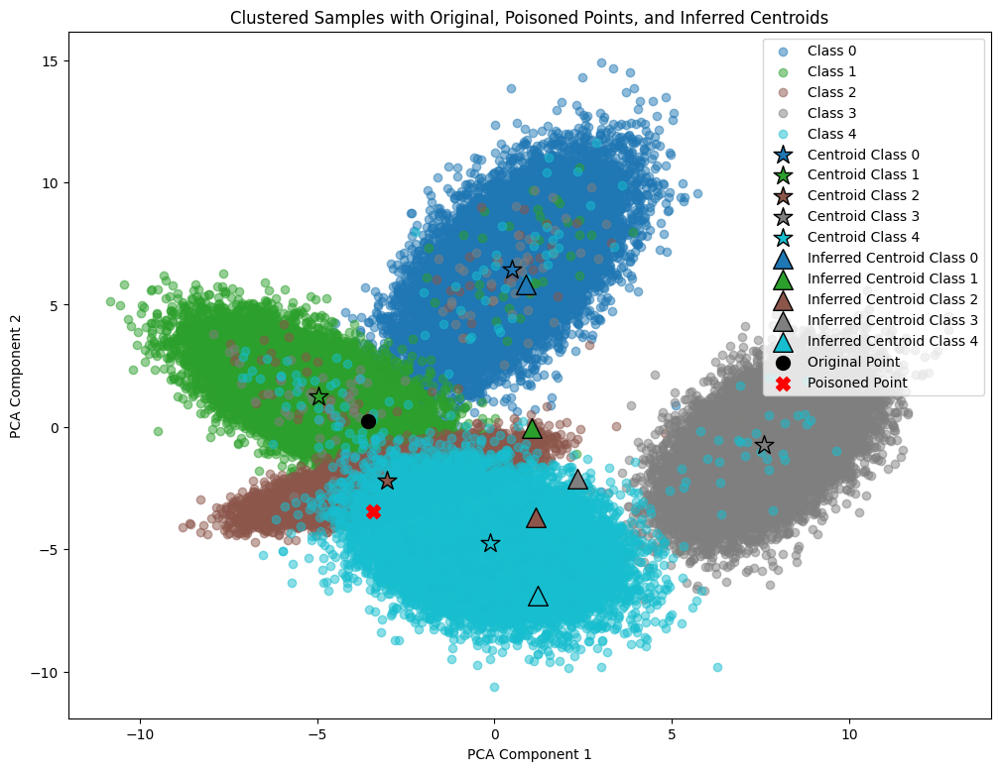

0

In [10]:
ATTACK_SAMPLES = 1000
X_original_centroid, X_inferred_centroid = attack(model, ATTACK_SAMPLES)
testRandomSample(model, X_inferred_centroid, TARGET_LABEL=2, plot=True)

In [11]:
computePerformance(X_inferred_centroid)


#############EVAL FOR TARGET LABEL: 0 ###############


MODEL'S PREDICTED LABEL:  4
MODEL'S PREDICTION AFTER POISONING:  0

MODEL'S PREDICTED LABEL:  2
MODEL'S PREDICTION AFTER POISONING:  2

ACC FOR CLASS 0: 0.5

############################


#############EVAL FOR TARGET LABEL: 1 ###############


MODEL'S PREDICTED LABEL:  0
MODEL'S PREDICTION AFTER POISONING:  4

MODEL'S PREDICTED LABEL:  1
MODEL'S PREDICTION AFTER POISONING:  1

ACC FOR CLASS 1: 0.5

############################


#############EVAL FOR TARGET LABEL: 2 ###############


MODEL'S PREDICTED LABEL:  1
MODEL'S PREDICTION AFTER POISONING:  4

MODEL'S PREDICTED LABEL:  3
MODEL'S PREDICTION AFTER POISONING:  3

ACC FOR CLASS 2: 0.0

############################


#############EVAL FOR TARGET LABEL: 3 ###############


MODEL'S PREDICTED LABEL:  1
MODEL'S PREDICTION AFTER POISONING:  0

MODEL'S PREDICTED LABEL:  0
MODEL'S PREDICTION AFTER POISONING:  2

ACC FOR CLASS 3: 0.0

############################


#############EVAL F

### ATTACK_SAMPLES = 10000

In [12]:
ATTACK_SAMPLES = 10000
X_original_centroid, X_inferred_centroid = attack(model, ATTACK_SAMPLES)
X_inferred_centroid

## Smaller sample size can also have None for inferred Centroids

{0: array([-0.26812803, -1.18527357, -3.04508033, -3.00522331, -2.90970865]),
 1: None,
 2: array([-2.02502696,  1.02444846,  2.64159078,  2.65089782,  1.98658282]),
 3: array([ 2.6340941 , -2.41821336,  2.59646717, -3.17430559, -2.89360169]),
 4: array([ 3.47029289, -2.97894115,  3.4178084 ,  1.67420816, -3.12323667])}

### ATTACK_SAMPLES = 100000


MODEL'S PREDICTED LABEL:  3
MODEL'S PREDICTION AFTER POISONING:  0


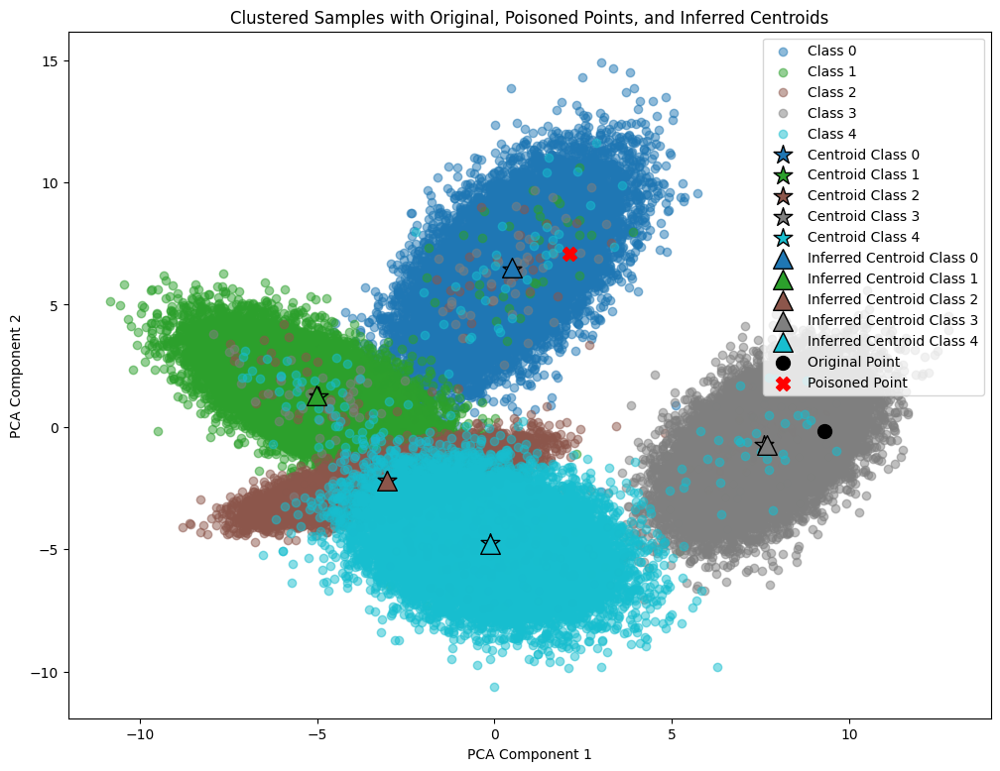

1

In [ ]:
ATTACK_SAMPLES = 100000
X_original_centroid, X_inferred_centroid = attack(model, ATTACK_SAMPLES)
testRandomSample(model, X_inferred_centroid, TARGET_LABEL=0, plot=True)

In [19]:
computePerformance(X_inferred_centroid)


#############EVAL FOR TARGET LABEL: 0 ###############


MODEL'S PREDICTED LABEL:  0
MODEL'S PREDICTION AFTER POISONING:  0

MODEL'S PREDICTED LABEL:  3
MODEL'S PREDICTION AFTER POISONING:  0

ACC FOR CLASS 0: 1.0

############################


#############EVAL FOR TARGET LABEL: 1 ###############


MODEL'S PREDICTED LABEL:  3
MODEL'S PREDICTION AFTER POISONING:  0

MODEL'S PREDICTED LABEL:  2
MODEL'S PREDICTION AFTER POISONING:  1

ACC FOR CLASS 1: 0.5

############################


#############EVAL FOR TARGET LABEL: 2 ###############


MODEL'S PREDICTED LABEL:  1
MODEL'S PREDICTION AFTER POISONING:  2

MODEL'S PREDICTED LABEL:  1
MODEL'S PREDICTION AFTER POISONING:  2

ACC FOR CLASS 2: 1.0

############################


#############EVAL FOR TARGET LABEL: 3 ###############


MODEL'S PREDICTED LABEL:  1
MODEL'S PREDICTION AFTER POISONING:  3

MODEL'S PREDICTED LABEL:  2
MODEL'S PREDICTION AFTER POISONING:  3

ACC FOR CLASS 3: 1.0

############################


#############EVAL F

### ATTACK_SAMPLES = 1000000


MODEL'S PREDICTED LABEL:  4
MODEL'S PREDICTION AFTER POISONING:  2


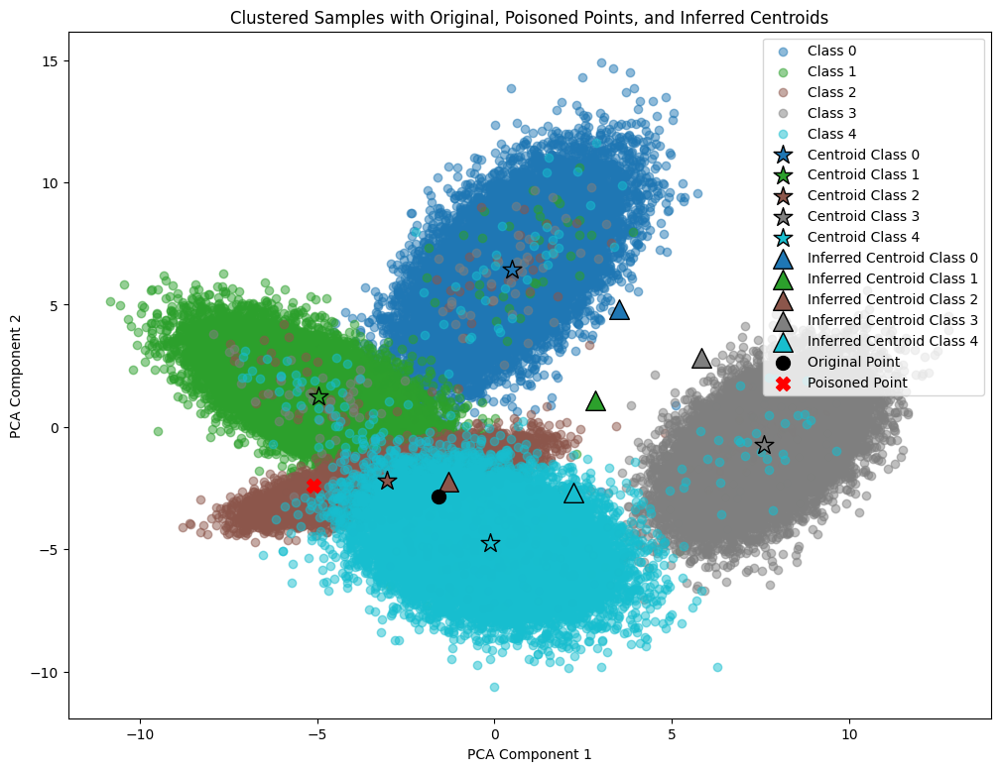

1

In [14]:
ATTACK_SAMPLES = 1000000
X_original_centroid, X_inferred_centroid = attack(model, ATTACK_SAMPLES)
testRandomSample(model, X_inferred_centroid, TARGET_LABEL=2, plot=True)

In [15]:
computePerformance(X_inferred_centroid)


#############EVAL FOR TARGET LABEL: 0 ###############


MODEL'S PREDICTED LABEL:  3
MODEL'S PREDICTION AFTER POISONING:  3

MODEL'S PREDICTED LABEL:  0
MODEL'S PREDICTION AFTER POISONING:  0

ACC FOR CLASS 0: 0.5

############################


#############EVAL FOR TARGET LABEL: 1 ###############


MODEL'S PREDICTED LABEL:  3
MODEL'S PREDICTION AFTER POISONING:  3

MODEL'S PREDICTED LABEL:  4
MODEL'S PREDICTION AFTER POISONING:  2

ACC FOR CLASS 1: 0.0

############################


#############EVAL FOR TARGET LABEL: 2 ###############


MODEL'S PREDICTED LABEL:  3
MODEL'S PREDICTION AFTER POISONING:  3

MODEL'S PREDICTED LABEL:  0
MODEL'S PREDICTION AFTER POISONING:  2

ACC FOR CLASS 2: 0.5

############################


#############EVAL FOR TARGET LABEL: 3 ###############


MODEL'S PREDICTED LABEL:  0
MODEL'S PREDICTION AFTER POISONING:  0

MODEL'S PREDICTED LABEL:  2
MODEL'S PREDICTION AFTER POISONING:  3

ACC FOR CLASS 3: 0.5

############################


#############EVAL F

### ATTACK_SAMPLES = 10000000

In [16]:
# ATTACK_SAMPLES = 10000000
# X_original_centroid, X_inferred_centroid = attack(model, ATTACK_SAMPLES)
# testRandomSample(model, X_inferred_centroid, TARGET_LABEL=2, plot=True)

In [17]:
# computePerformance(X_inferred_centroid)

---

---
## REAL DATA SAMPLE

In [12]:
# DATA_PATH = './data/winequality-red.csv'
# DELIM =';'
# LABEL_COL = 'quality'

#############################

# DATA_PATH = './data/winequality-red.csv'
# DELIM =';'
# LABEL_COL = 'quality'

#############################

# DATA_PATH = './data/WineQT.csv'
# DELIM =','
# LABEL_COL = 'quality'

#############################

DATA_PATH = './data/IRIS.csv'
DELIM =','
LABEL_COL = 'species'

#############################


wine_df = pd.read_csv(DATA_PATH, delimiter=DELIM)


# wine_df.drop(['Id'], axis=1, inplace=True)
wine_df

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,Iris-setosa
1,4.9,3.0,1.4,0.2,Iris-setosa
2,4.7,3.2,1.3,0.2,Iris-setosa
3,4.6,3.1,1.5,0.2,Iris-setosa
4,5.0,3.6,1.4,0.2,Iris-setosa
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,Iris-virginica
146,6.3,2.5,5.0,1.9,Iris-virginica
147,6.5,3.0,5.2,2.0,Iris-virginica
148,6.2,3.4,5.4,2.3,Iris-virginica


In [13]:
y = wine_df[LABEL_COL]
X  = wine_df.drop([LABEL_COL], axis=1)
X = X.to_numpy()

NUM_SAMPLES = X.shape[0]
NUM_FEATURES = X.shape[1]
NUM_CLASSES = y.nunique()


encoder = LabelEncoder()
y = encoder.fit_transform(y)

print(X.shape , y.shape)

(150, 4) (150,)


In [14]:
# Train model on original data
print("Training on original data:")

svm = SVC(kernel='rbf', random_state=STATE, gamma=.10, C=1.0)

model = train_model(X, y, model=svm)

Training on original data:
Model Accuracy: 100.00%


In [32]:
ATTACK_SAMPLES = 1000000
X_original_centroid, X_inferred_centroid = attack(model, ATTACK_SAMPLES)

print("\n#####\nORIGINAL CENTROID : ", X_original_centroid)
print("INFERRED CENTROID : ", X_inferred_centroid, "\n#####\n")


#####
ORIGINAL CENTROID :  {0: array([5.006, 3.418, 1.464, 0.244]), 1: array([5.936, 2.77 , 4.26 , 1.326]), 2: array([6.588, 2.974, 5.552, 2.026])}
INFERRED CENTROID :  {0: array([ 3.49160614,  4.7463016 , -0.90743808,  2.53717034]), 1: array([3.65026842, 2.30305267, 2.04869516, 2.59120465]), 2: array([-1.15760698,  2.70291776, -3.07360457,  0.9472722 ])} 
#####




MODEL'S PREDICTED LABEL:  1
MODEL'S PREDICTION AFTER POISONING:  1


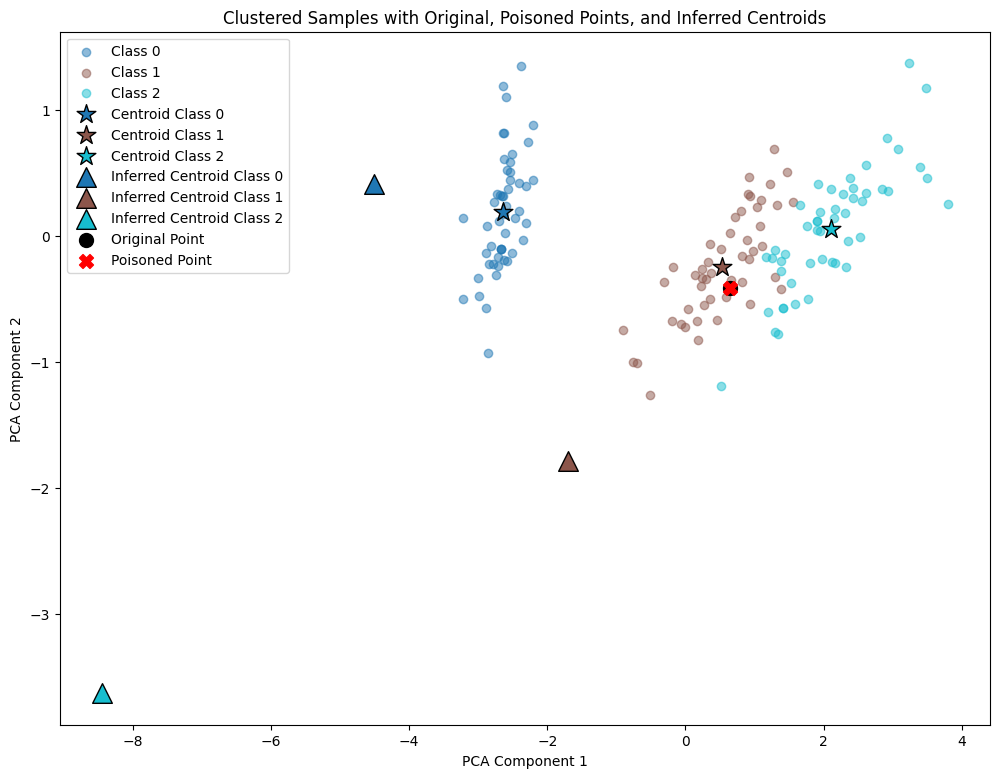

1

In [33]:
testRandomSample(model, X_inferred_centroid, TARGET_LABEL=1, plot=True)

In [34]:
computePerformance(X_inferred_centroid)


#############EVAL FOR TARGET LABEL: 0 ###############


MODEL'S PREDICTED LABEL:  2
MODEL'S PREDICTION AFTER POISONING:  2

MODEL'S PREDICTED LABEL:  1
MODEL'S PREDICTION AFTER POISONING:  0

MODEL'S PREDICTED LABEL:  1
MODEL'S PREDICTION AFTER POISONING:  0

MODEL'S PREDICTED LABEL:  2
MODEL'S PREDICTION AFTER POISONING:  2

MODEL'S PREDICTED LABEL:  2
MODEL'S PREDICTION AFTER POISONING:  2

MODEL'S PREDICTED LABEL:  2
MODEL'S PREDICTION AFTER POISONING:  2

MODEL'S PREDICTED LABEL:  1
MODEL'S PREDICTION AFTER POISONING:  0

MODEL'S PREDICTED LABEL:  0
MODEL'S PREDICTION AFTER POISONING:  0

MODEL'S PREDICTED LABEL:  2
MODEL'S PREDICTION AFTER POISONING:  2

MODEL'S PREDICTED LABEL:  0
MODEL'S PREDICTION AFTER POISONING:  0

MODEL'S PREDICTED LABEL:  1
MODEL'S PREDICTION AFTER POISONING:  0

MODEL'S PREDICTED LABEL:  2
MODEL'S PREDICTION AFTER POISONING:  2

MODEL'S PREDICTED LABEL:  2
MODEL'S PREDICTION AFTER POISONING:  2

MODEL'S PREDICTED LABEL:  2
MODEL'S PREDICTION AFTER POISON

NOTE:

-  Need to make a more realistic random dataset otherwise it can give `None` for some label during infernece
- Depends on the `serving models accuracy`